# Clustering of all gastruloid data

In [13]:
%matplotlib inline
import numpy as np
import pandas as pd
import scanpy as sc
from functools import reduce
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib as mpl
from anndata import AnnData, read_h5ad
import singlecellmultiomics.bamProcessing.bamToRNACounts

sc.settings.verbosity = 3             # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.logging.print_header()

scanpy==1.8.2 anndata==0.7.8 umap==0.5.2 numpy==1.20.3 scipy==1.7.3 pandas==1.4.1 scikit-learn==0.23.2 statsmodels==0.12.2 pynndescent==0.5.6


In [14]:
sc.settings.verbosity = 3  # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.logging.print_header()
sc.set_figure_params(dpi=50, color_map = 'viridis')

scanpy==1.8.2 anndata==0.7.8 umap==0.5.2 numpy==1.20.3 scipy==1.7.3 pandas==1.4.1 scikit-learn==0.23.2 statsmodels==0.12.2 pynndescent==0.5.6


# Load the dataset

In [3]:
pathToData = '/Users/m.blotenburg/Documents/Projects/Mouse_Scartrace/Data_analysis/Transcriptome_analysis/120hAA/20190904_CS2pipeOutput_RNAVelocity_VAN2663_VAN2703_VAN2806_VAN3423_OUD3693/CS2pipe_datasets/120hAA/'

In [4]:
df120 = pd.read_pickle(pathToData + '120hAA_Transcriptome_dataFrame_FACS2507_FACS0108_allplates.pickle.gz')

In [5]:
results_file = pathToData + '/write/dataset120hAA.h5ad'  # the file that will store the analysis results

In [6]:
df120.head()

,A1_1.C5A4,A1_10.C5C3,A1_100.C5C3,A1_101.C5C3,A1_102.C5C3,A1_103.C5C3,A1_104.C5C3,A1_105.C5C3,A1_106.C5C3,A1_107.C5C3,...,H2_90.C5F10,H2_91.C5F10,H2_92.C5F10,H2_93.C5F10,H2_94.C5F10,H2_95.C5F10,H2_96.C5F10,H2_97.C5F10,H2_98.C5F10,H2_99.C5F10
ENSMUSG00000000028_16,NaN,4.0,1.0,NaN,2.0,NaN,NaN,2.0,2.0,3.0,...,NaN,1.0,1.0,2.0,NaN,1.0,NaN,1.0,3.0,NaN
ENSMUSG00000000031_7,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,1.0,NaN,NaN,NaN,NaN,1.0,NaN,NaN,NaN
ENSMUSG00000000037_X,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
ENSMUSG00000000056_11,1.0,1.0,NaN,NaN,NaN,NaN,NaN,NaN,2.0,NaN,...,NaN,NaN,1.0,NaN,NaN,NaN,NaN,1.0,NaN,NaN
ENSMUSG00000000078_13,NaN,1.0,4.0,NaN,NaN,1.0,NaN,NaN,NaN,2.0,...,NaN,NaN,NaN,NaN,NaN,NaN,3.0,1.0,NaN,2.0


In [7]:
df120 = df120.fillna(0)

In [8]:
print('Dataset 120hAA')
print(df120.shape)

Dataset 120hAA
(16258, 4600)


In [9]:
df120 = df120.loc[df120.index.dropna()]

In [10]:
df120 = df120.astype(float)

In [11]:
adata_120 = sc.AnnData(df120.transpose())

In [12]:
adata=adata_120

# Preprocessing of dataset 1 - 120h AA

make gene names more workable

In [15]:
adata.var.index = adata.var.index.str.split('_',0,expand=True)

In [16]:
index = adata.var.reset_index(level=(1))
index = index.rename(index=str, columns={"level_1": "chromosome"})
index.head()

,chromosome
ENSMUSG00000000028,16
ENSMUSG00000000031,7
ENSMUSG00000000037,X
ENSMUSG00000000056,11
ENSMUSG00000000078,13


In [17]:
index['ensembl'] = index.index

In [18]:
adata.var.index = index.index

In [19]:
adata.var['ensembl'] = index['ensembl']
adata.var['chromosome'] = index['chromosome']

In [20]:
conversion_table = singlecellmultiomics.bamProcessing.bamToRNACounts.get_gene_id_to_gene_name_conversion_table('/Users/m.blotenburg/Documents/Projects/Mouse_Scartrace/Data_analysis/RNAvelocity/exons.gtf.gz')


In [21]:
adata.var_names = np.array([conversion_table.get(x,x) for x in adata.var_names ])

In [22]:
adata.var_names_make_unique()

Show those genes that yield the highest fraction of counts in each single cells, across all cells.

normalizing counts per cell
    finished (0:00:00)


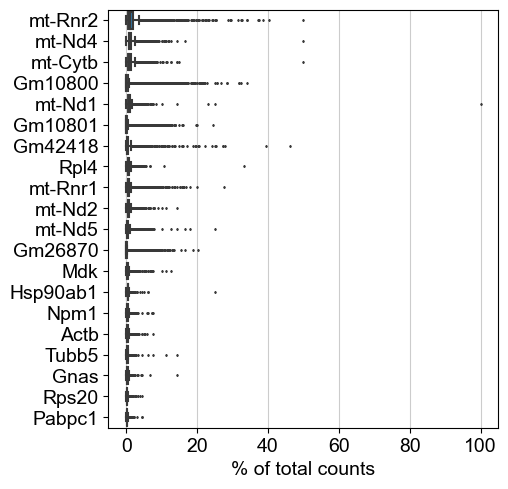

In [23]:
sc.pl.highest_expr_genes(adata, n_top=20)

Basic filtering.

In [24]:
adata

AnnData object with n_obs × n_vars = 4600 × 16258
    var: 'ensembl', 'chromosome'

In [33]:
adata.write("adata_20190904.h5ad")

# To load adata file with corrected gene names and continue:

In [34]:
adata = sc.read("adata_20190904.h5ad")

In [25]:
minCount = 1000
sc.pp.filter_cells(adata, min_counts=minCount)
sc.pp.filter_cells(adata, min_genes=100)
sc.pp.filter_genes(adata, min_cells=2)

filtered out 1069 cells that have less than 1000 counts


Let us assemple some information about mitochondrial genes, which are important for quality control.

Citing from "Simple Single Cell" workflows [(Lun, McCarthy & Marioni, 2017)](https://master.bioconductor.org/packages/release/workflows/html/simpleSingleCell.html#examining-gene-level-metrics):

> High proportions are indicative of poor-quality cells (Islam et al. 2014; Ilicic et al. 2016), possibly because of loss of cytoplasmic RNA from perforated cells. The reasoning is that mitochondria are larger than individual transcript molecules and less likely to escape through tears in the cell membrane.

Note you can also use the function `pp.calculate_qc_metrics` to compute the fraction of mitochondrial genes and additional measures.

In [26]:
mito_genes = adata.var_names.str.startswith('mt-')

# for each cell compute fraction of counts in mito genes vs. all genes
adata.obs['percent_mito'] = np.sum(
    adata[:, mito_genes].X, axis=1) / np.sum(adata.X, axis=1)
# add the total counts per cell as observations-annotation to adata
adata.obs['n_counts'] = adata.X.sum(axis=1)

A violin plot of the computed quality measures.

/Users/m.blotenburg/miniconda3/envs/scanpy2/lib/python3.8/site-packages/anndata/_core/anndata.py:1228: FutureWarning: The `inplace` parameter in pandas.Categorical.reorder_categories is deprecated and will be removed in a future version. Reordering categories will always return a new Categorical object.
  c.reorder_categories(natsorted(c.categories), inplace=True)
... storing 'chromosome' as categorical


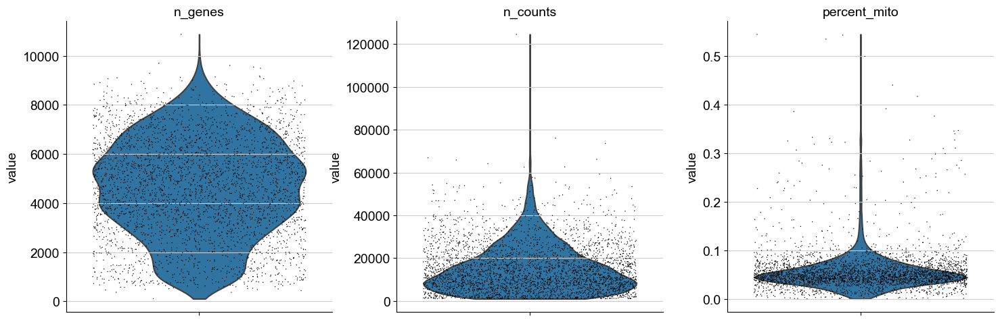

In [27]:
sc.pl.violin(adata, ['n_genes', 'n_counts', 'percent_mito'],
             jitter=0.4, multi_panel=True)

Remove cells that have too many mitochondrial genes expressed or too many total counts.

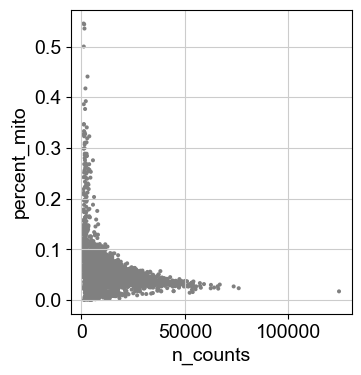

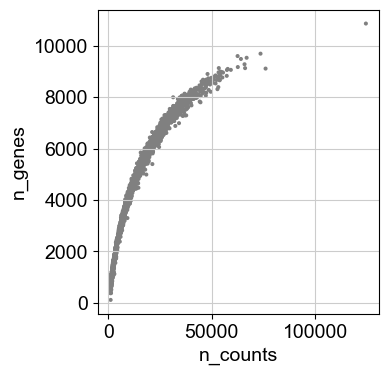

In [28]:
sc.pl.scatter(adata, x='n_counts', y='percent_mito')
sc.pl.scatter(adata, x='n_counts', y='n_genes')

In [29]:
adata

AnnData object with n_obs × n_vars = 3531 × 16258
    obs: 'n_counts', 'n_genes', 'percent_mito'
    var: 'ensembl', 'chromosome', 'n_cells'

Actually do the filtering.

In [30]:
adata = adata[adata.obs['percent_mito'] < 0.15, :]

throw out any other unwanted genes

In [31]:
# removing genes with annotations we are not interested in
banned = ['NA', 'mt-', "Malat1", 'Rpl', 'Rps']
keptGenes = [geneName for geneName in adata.var.index if not any( (b in geneName for b in banned) )]

adata = adata[:,keptGenes]

adata

View of AnnData object with n_obs × n_vars = 3433 × 15953
    obs: 'n_counts', 'n_genes', 'percent_mito'
    var: 'ensembl', 'chromosome', 'n_cells'

minCount = 1000
sc.pp.filter_cells(adata, min_counts=minCount)
sc.pp.filter_cells(adata, min_genes=100)
sc.pp.filter_genes(adata, min_cells=2)

Total-count normalize (library-size correct) the data matrix $\mathbf{X}$ to 10,000 reads per cell, so that counts become comparable among cells.

In [32]:
sc.pp.normalize_per_cell(adata, counts_per_cell_after=minCount)

normalizing by total count per cell


Trying to set attribute `.obs` of view, copying.


    finished (0:00:01): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)


Logarithmize the data.

In [33]:
sc.pp.log1p(adata)

Set the `.raw` attribute of AnnData object to the logarithmized raw gene expression for later use in differential testing and visualizations of gene expression. This simply freezes the state of the AnnData object. While many people consider the normalized data matrix as the "relevant data" for visualization and differential testing, some would prefer to store the unnormalized data.

In [34]:
adata.raw = adata

Identify highly-variable genes.

In [35]:
sc.pp.highly_variable_genes(adata, min_mean=0.0125, max_mean=3, min_disp=0.5)

extracting highly variable genes
    finished (0:00:01)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


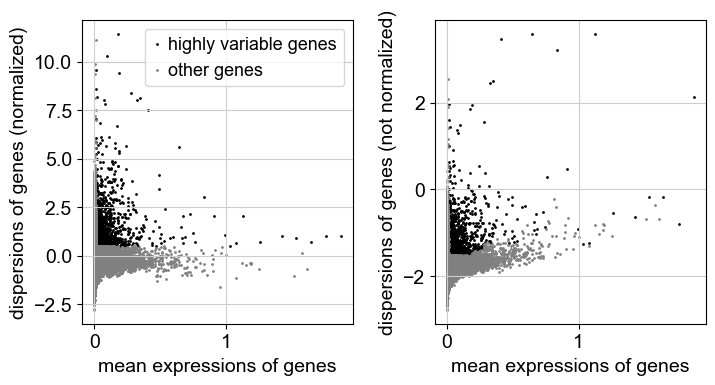

In [36]:
sc.pl.highly_variable_genes(adata)

Actually do the filtering.

In [37]:
#adata = adata[:, adata.var['highly_variable']]

Regress out effects of total counts per cell and the percentage of mitochondrial genes expressed. Scale the data to unit variance.

In [38]:
sc.pp.regress_out(adata, ['n_counts', 'percent_mito'])

regressing out ['n_counts', 'percent_mito']
    finished (0:01:13)


Scale each gene to unit variance. Clip values exceeding standard deviation 10. 

In [39]:
sc.pp.scale(adata, max_value=10)

normalizing counts per cell


/Users/m.blotenburg/miniconda3/envs/scanpy2/lib/python3.8/site-packages/scanpy/preprocessing/_normalization.py:182: UserWarning: Some cells have zero counts
  warn(UserWarning('Some cells have zero counts'))


    finished (0:00:00)


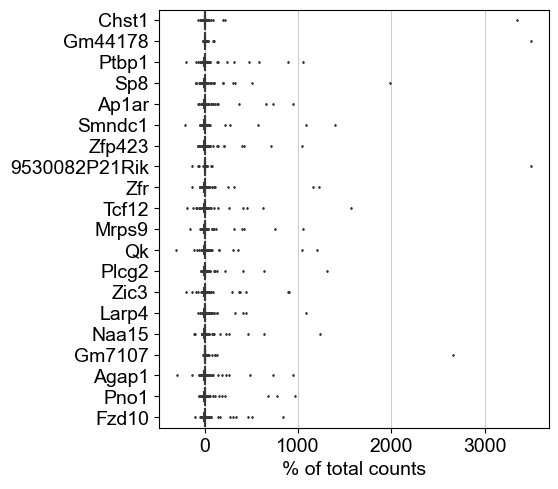

In [40]:
sc.pl.highest_expr_genes(adata, n_top=20)

In [41]:
adata

AnnData object with n_obs × n_vars = 3433 × 15953
    obs: 'n_counts', 'n_genes', 'percent_mito'
    var: 'ensembl', 'chromosome', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'log1p', 'hvg'

## Principal component analysis

Reduce the dimensionality of the data by running principal component analysis (PCA), which reveals the main axes of variation and denoises the data.

In [42]:
sc.tl.pca(adata, svd_solver='arpack')

computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:00)


We can make a scatter plot in the PCA coordinates, but we will not use that later on.

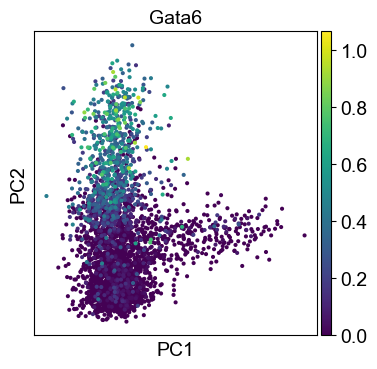

In [43]:
plotgene = [geneName for geneName in adata.var.index if any( (b in geneName for b in ['Gata6']) )]
sc.pl.pca(adata, color=plotgene)

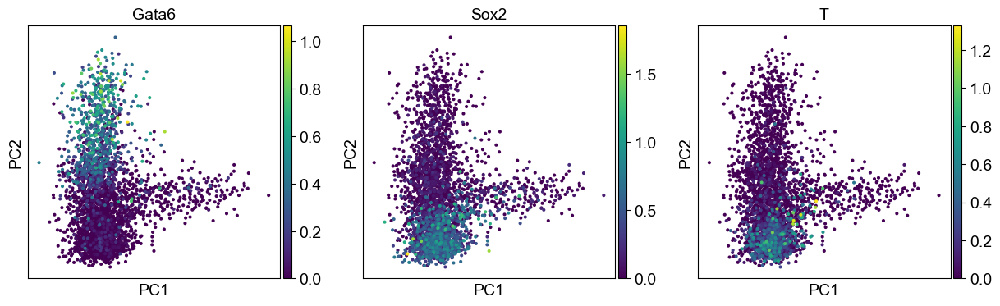

In [44]:
sc.pl.pca(adata, color=['Gata6','Sox2','T'])

Let us inspect the contribution of single PCs to the total variance in the data. This gives us information about how many PCs we should consider in order to compute the neighborhood relations of cells, e.g. used in the clustering function  `sc.tl.louvain()` or tSNE `sc.tl.tsne()`. In our experience, often, a rough estimate of the number of PCs does fine.

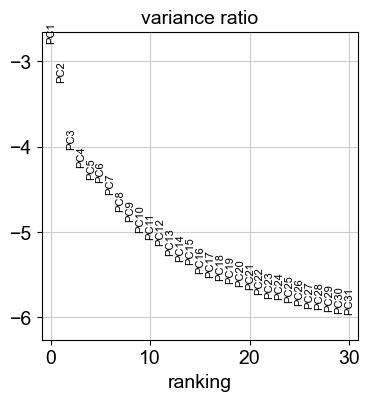

In [45]:
sc.pl.pca_variance_ratio(adata, log=True)

Save the result.

In [57]:
adata.write(results_file)

In [46]:
adata

AnnData object with n_obs × n_vars = 3433 × 15953
    obs: 'n_counts', 'n_genes', 'percent_mito'
    var: 'ensembl', 'chromosome', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'log1p', 'hvg', 'pca'
    obsm: 'X_pca'
    varm: 'PCs'

## Computing the neighborhood graph

Let us compute the neighborhood graph of cells using the PCA representation of the data matrix. You might simply use default values here. For the sake of reproducing Seurat's results, let's take the following values.

In [47]:
sc.pp.neighbors(adata, n_neighbors=10, n_pcs=40)

computing neighbors
    using 'X_pca' with n_pcs = 40


OMP: Info #276: omp_set_nested routine deprecated, please use omp_set_max_active_levels instead.


    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:03)


## Embedding the neighborhood graph

We advertise embedding the graph in 2 dimensions using UMAP ([McInnes et al., 2018](https://arxiv.org/abs/1802.03426)), see below. It is  potentially more faithful to the global connectivity of the manifold than tSNE, i.e., it better preservers trajectories. In some ocassions, you might still observe disconnected clusters and similar connectivity violations. They can usually be remedied by running:

```
tl.paga(adata)
pl.paga(adata, plot=False)  # remove `plot=False` if you want to see the coarse-grained graph
tl.umap(adata, init_pos='paga')
```

In [48]:
sc.tl.umap(adata)

computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:05)


In [49]:
batches = [ob.split('.')[1] for ob in adata.obs_names]
batches = [ob.split('_')[0] for ob in batches]

adata.obs['batch'] = batches

In [50]:
adata.obs

,n_counts,n_genes,percent_mito,batch
A1_1.C5A4,21073.0,6631,0.043039,C5A4
A1_10.C5C3,33740.0,8099,0.037249,C5C3
A1_100.C5C3,7018.0,3692,0.058679,C5C3
A1_102.C5C3,13885.0,5166,0.040306,C5C3
A1_103.C5C3,1074.0,782,0.116574,C5C3
...,...,...,...,...
H2_95.C5F10,15466.0,5543,0.033142,C5F10
H2_96.C5F10,8242.0,3853,0.013755,C5F10
H2_97.C5F10,14569.0,5452,0.047151,C5F10
H2_98.C5F10,6517.0,3561,0.063496,C5F10


/Users/m.blotenburg/miniconda3/envs/scanpy2/lib/python3.8/site-packages/anndata/_core/anndata.py:1228: FutureWarning: The `inplace` parameter in pandas.Categorical.reorder_categories is deprecated and will be removed in a future version. Reordering categories will always return a new Categorical object.
  c.reorder_categories(natsorted(c.categories), inplace=True)
... storing 'batch' as categorical


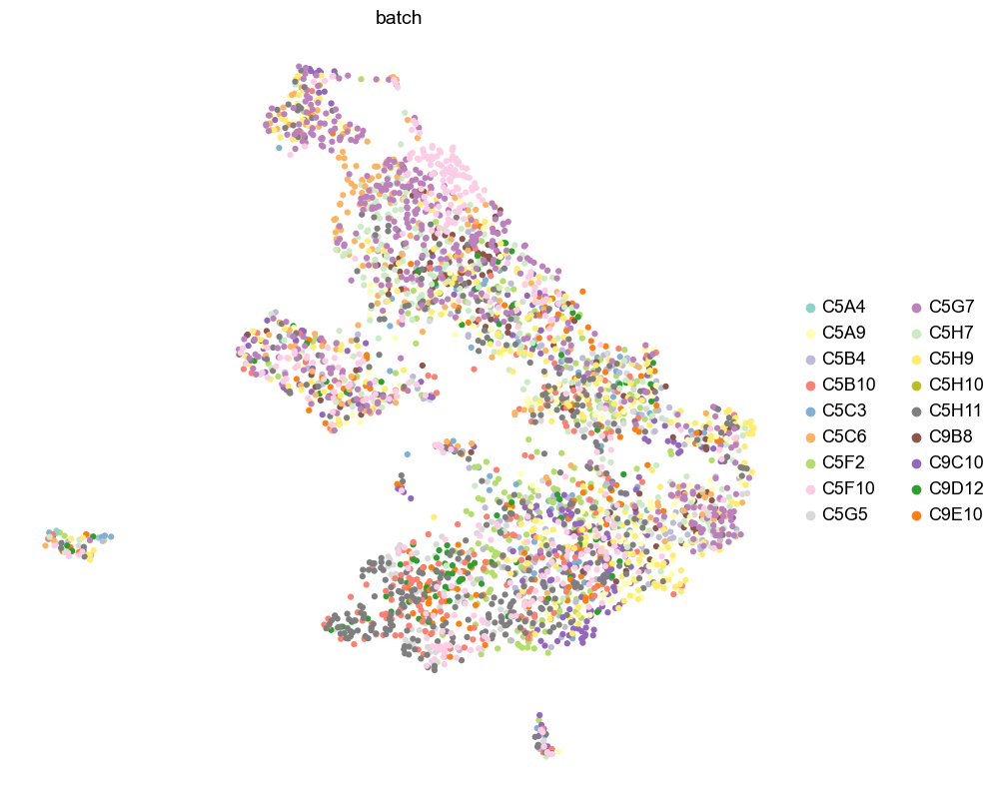

In [51]:
cols = sns.color_palette("Set3") + sns.color_palette("tab10_r")
fig, ax = plt.subplots(figsize=(10,10))

ax=sc.pl.umap(adata, color='batch',ax=ax, palette=cols,size=80, frameon = False)

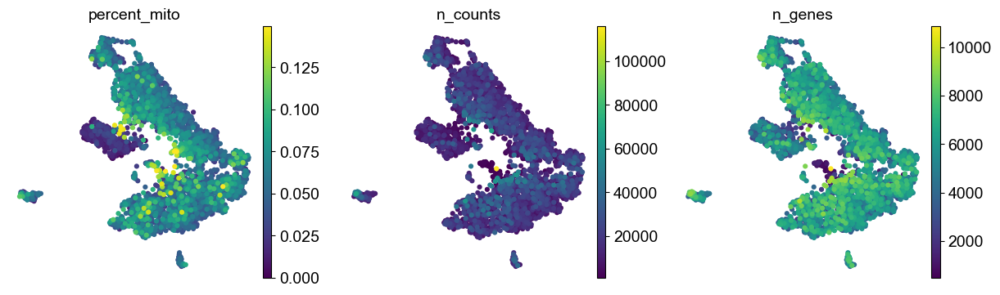

In [52]:
sc.pl.umap(adata, color=['percent_mito','n_counts', 'n_genes'], use_raw=True, frameon=False,size = 80)

As we set the `.raw` attribute of `adata`, the previous plots showed the "raw" (normalized, logarithmized, but uncorrected) gene expression. You can also plot the scaled and corrected gene expression by explicitly stating that you don't want to use `.raw`.

## Clustering the neighborhood graph

As Seurat and many others, we recommend the Louvain graph-clustering method (community detection based on optimizing modularity). It has been proposed for single-cell data by [Levine et al. (2015)](https://doi.org/10.1016/j.cell.2015.05.047). Note that Louvain clustering directly clusters the neighborhood graph of cells, which we already computed in the previous section.

In [71]:
sc.tl.leiden(adata)

running Leiden clustering
    finished: found 15 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:00)


Plot the clusters, which agree quite well with the result of Seurat.

In [72]:
#fig, ax = plt.subplots(figsize=(10,10))
#sc.pl.umap(adata, color='louvain',ax=ax, palette=sc.pl.palettes.default_20,size=100)



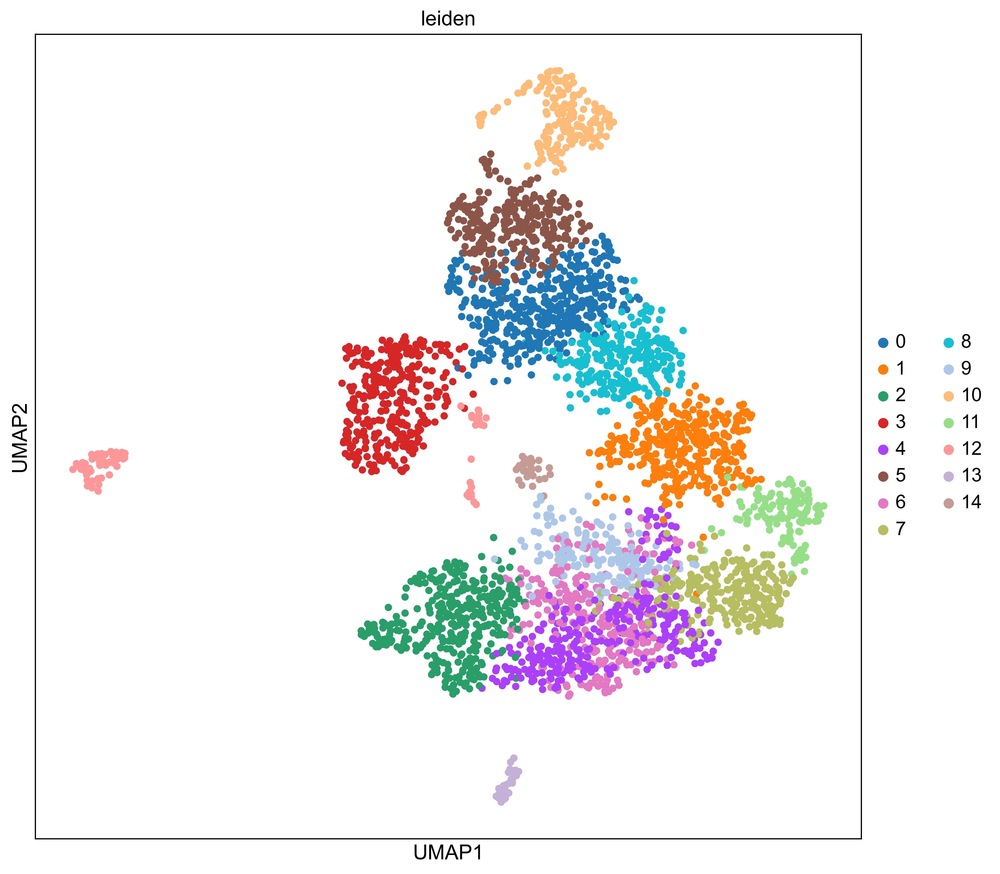

In [73]:
fig, ax = plt.subplots(figsize=(10,10))
sc.pl.umap(adata, color='leiden',ax=ax, palette=sc.pl.palettes.default_20,size=100)

Save the result.

In [80]:
adata.write(results_file)

## Define marker genes per cluster


### Cluster 0/6 - Early endoderm??

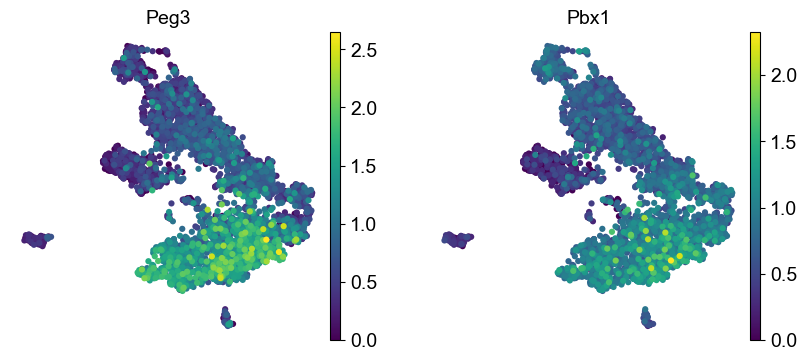

In [53]:
sc.pl.umap(adata, color=['Peg3', 'Pbx1'], use_raw=True, frameon=False, size = 80)

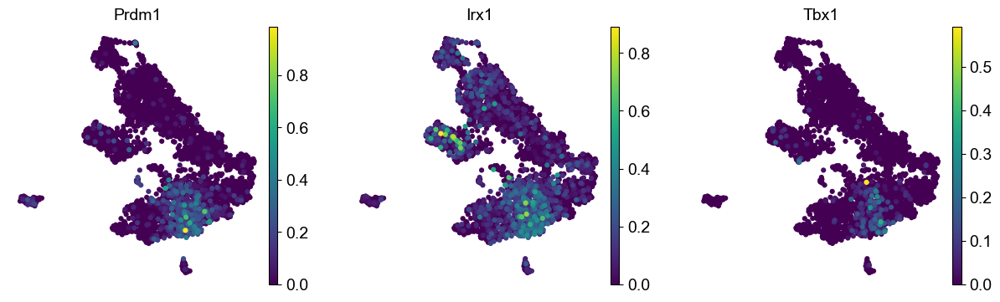

In [54]:
sc.pl.umap(adata, color=['Prdm1', 'Irx1', 'Tbx1'], use_raw=True, frameon=False, size = 80)

### Cluster 1 - Early heart progenitors

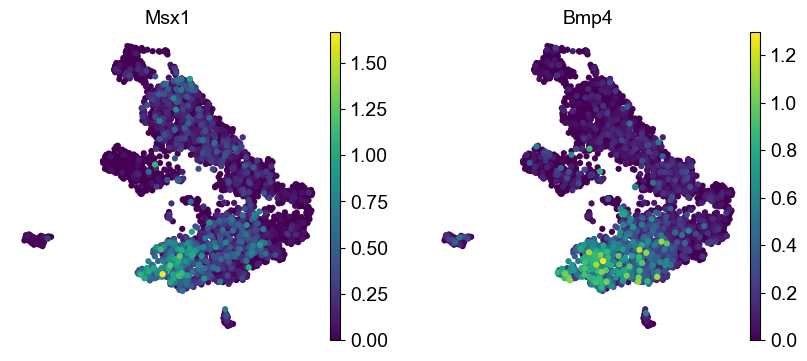

In [55]:
sc.pl.umap(adata, color=['Msx1', 'Bmp4'], use_raw=True, frameon=False, size = 80)

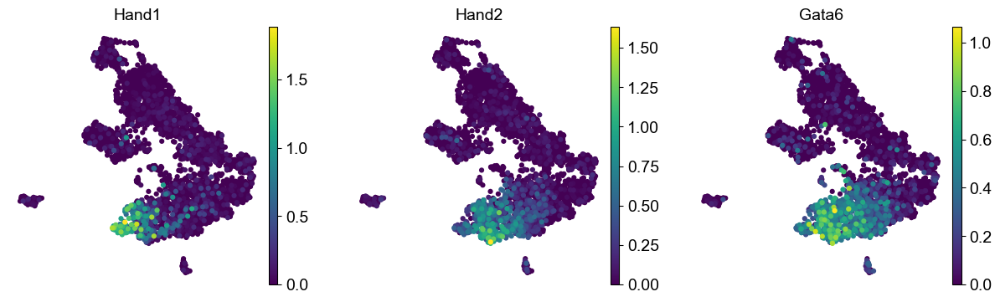

In [56]:
sc.pl.umap(adata, color=['Hand1', 'Hand2', 'Gata6'], use_raw=True, frameon=False, size = 80)

### Cluster 2/4 - Neurons

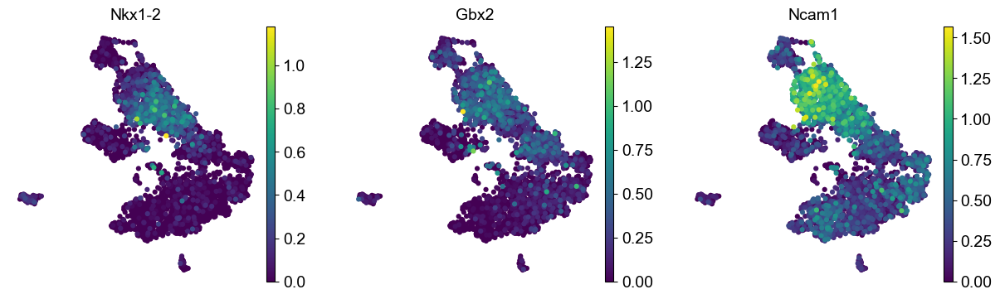

In [57]:
sc.pl.umap(adata, color=['Nkx1-2', 'Gbx2', 'Ncam1'], frameon=False, size = 80)

### Cluster 3 - Presomitic mesoderm

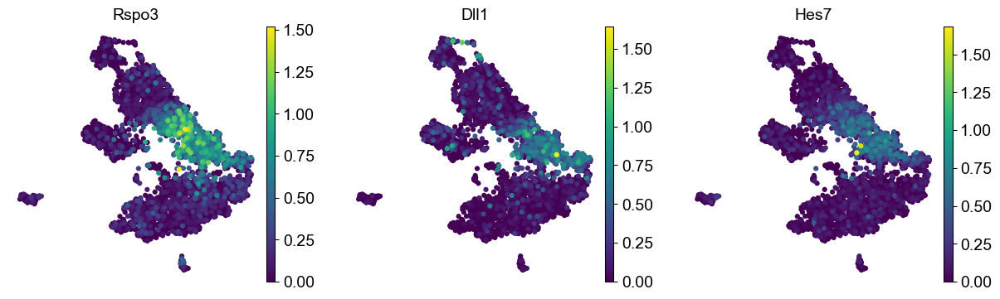

In [58]:
sc.pl.umap(adata, color=['Rspo3', 'Dll1', 'Hes7'], use_raw=True, frameon=False, size = 80)

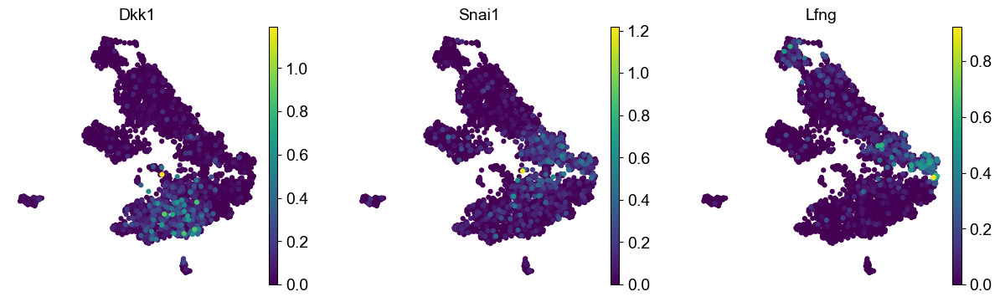

In [59]:
sc.pl.umap(adata, color=['Dkk1', 'Snai1', 'Lfng'], use_raw=True, frameon=False, size = 80)

### Cluster 5 - allantois + ?

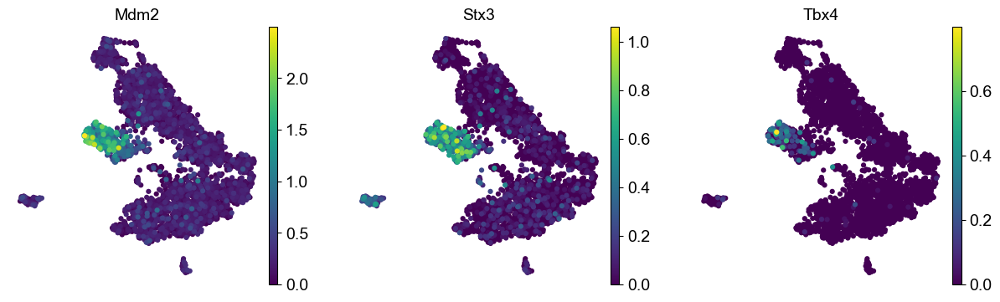

In [60]:
sc.pl.umap(adata, color=['Mdm2', 'Stx3', 'Tbx4'], use_raw=True, frameon=False, size = 80)

### Cluster 7 - Tailbud

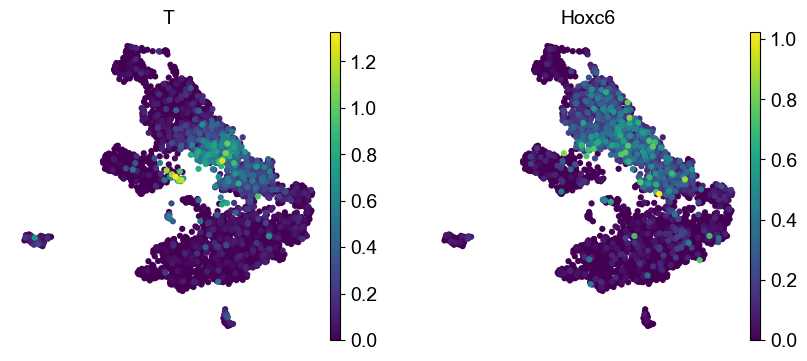

In [61]:
sc.pl.umap(adata, color=['T', 'Hoxc6'], use_raw = True, frameon=False, size = 80)

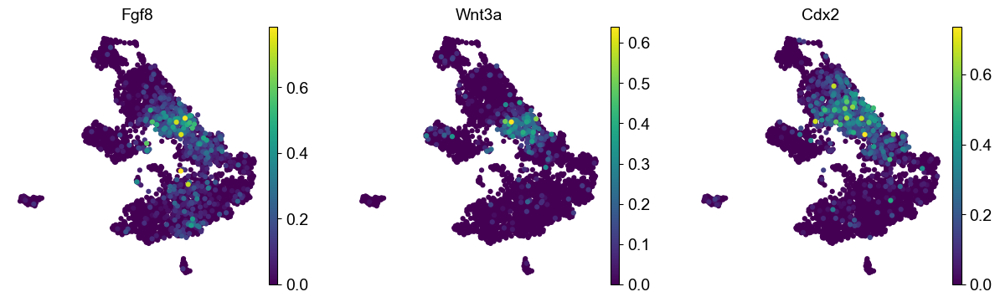

In [62]:
sc.pl.umap(adata, color=['Fgf8', 'Wnt3a', 'Cdx2'], use_raw=True, frameon=False, size = 80)

### Cluster 4/9 - Neurons

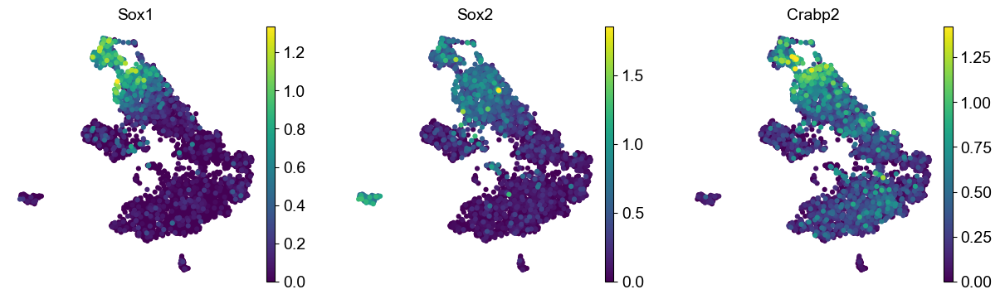

In [63]:
sc.pl.umap(adata, color=['Sox1', 'Sox2', 'Crabp2'], use_raw=True, frameon=False, size = 80)

### Cluster 8 - Early somitic

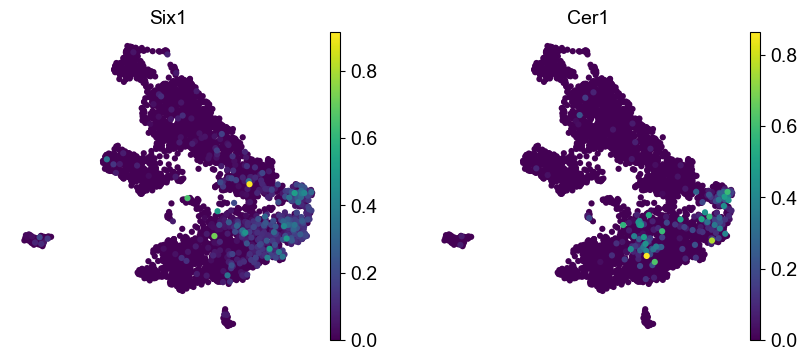

In [64]:
sc.pl.umap(adata, color=['Six1', 'Cer1'], use_raw=True, frameon=False, size = 80)

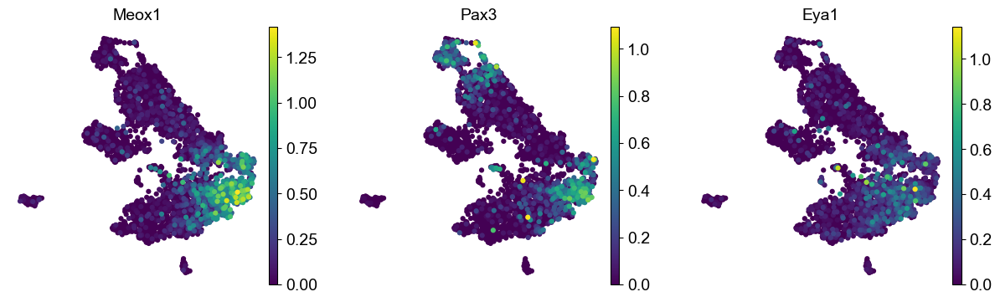

In [65]:
sc.pl.umap(adata, color=['Meox1', 'Pax3', 'Eya1'], use_raw=True, frameon=False, size = 80)

### Cluster 9 - Anterior neural / Neurectoderm

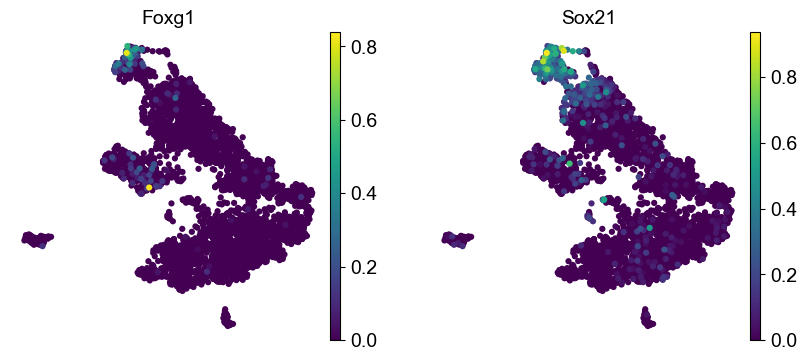

In [66]:
sc.pl.umap(adata, color=['Foxg1', 'Sox21'], use_raw = True, frameon=False, size = 80)

#### Cluster 9 - branchial arches

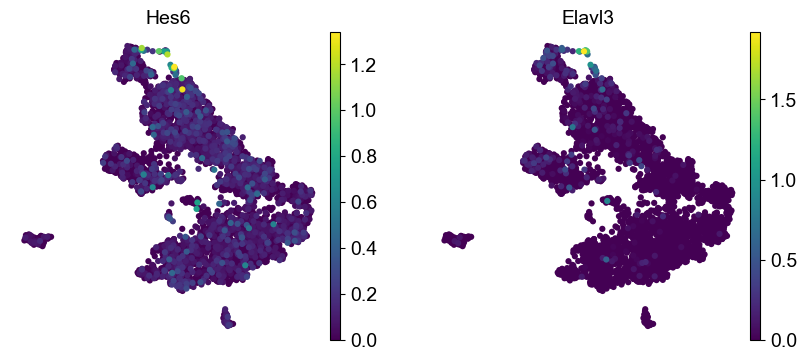

In [67]:
sc.pl.umap(adata, color=['Hes6', 'Elavl3'], use_raw = True, frameon=False, size = 80)

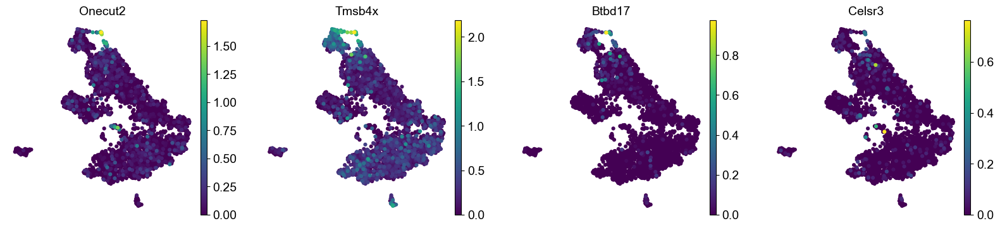

In [68]:
sc.pl.umap(adata, color=['Onecut2', 'Tmsb4x', 'Btbd17','Celsr3'], use_raw = True, frameon=False, size = 80)

### Cluster 10 - Somitogenesis wavefront

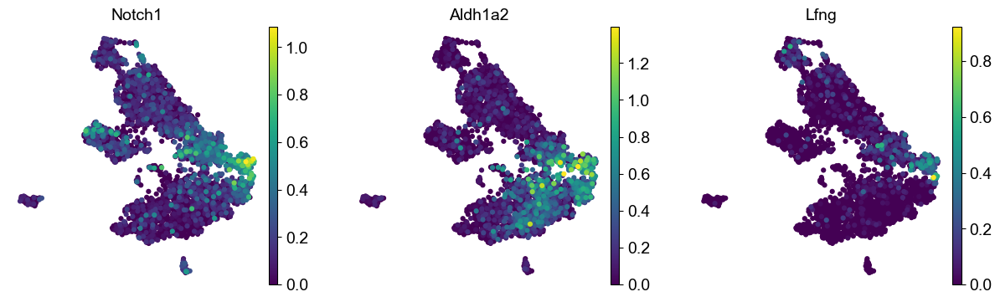

In [69]:
sc.pl.umap(adata, color=['Notch1', 'Aldh1a2', 'Lfng'], use_raw = True, frameon=False, size = 80)

### Cluster 11 - PGCs and node

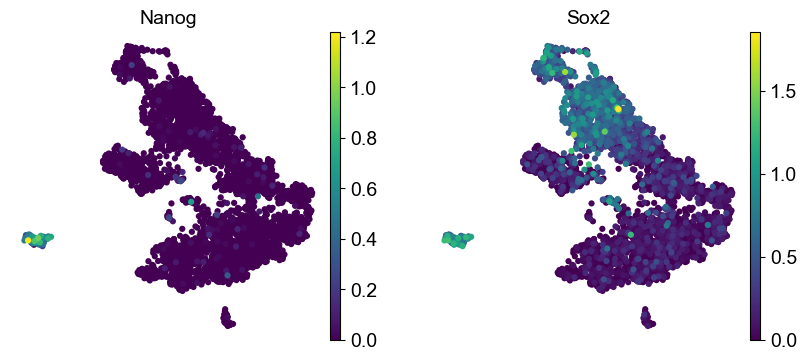

In [70]:
sc.pl.umap(adata, color=['Nanog', 'Sox2'], use_raw = True, frameon=False, size = 80)

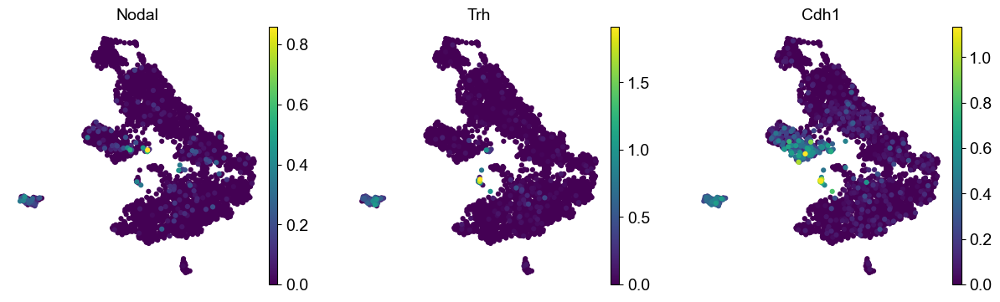

In [71]:
sc.pl.umap(adata, color=['Nodal', 'Trh', 'Cdh1'], use_raw = True, frameon=False, size = 80)

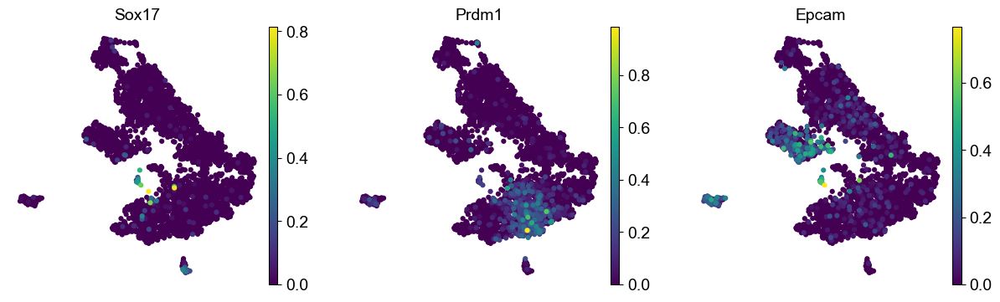

In [72]:
sc.pl.umap(adata, color=['Sox17', 'Prdm1', 'Epcam'], use_raw = True, frameon=False, size = 80)

#### - Node (pit)

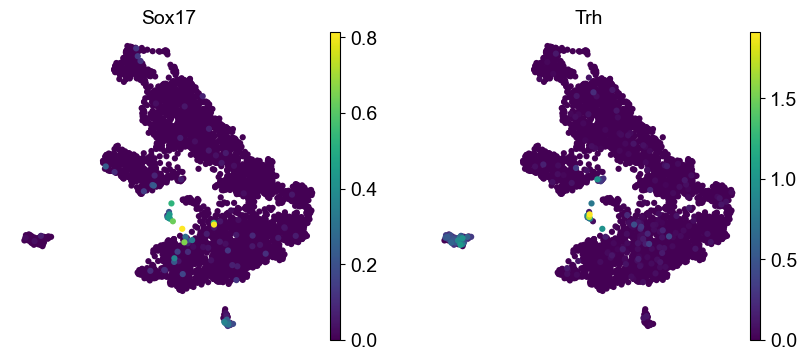

In [73]:
sc.pl.umap(adata, color=['Sox17', 'Trh'], use_raw = True, frameon=False, size = 80)

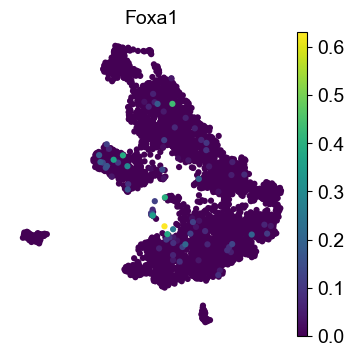

In [74]:
sc.pl.umap(adata, color=['Foxa1'], use_raw=True, frameon=False, size = 80)

### Cluster 12 - Haemogenic

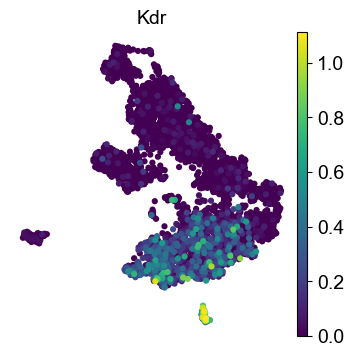

In [75]:
sc.pl.umap(adata, color=['Kdr'], use_raw = True, frameon=False, size = 80)

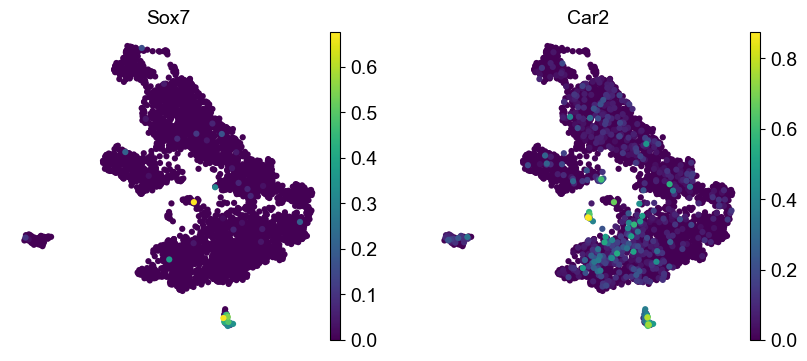

In [76]:
sc.pl.umap(adata, color=['Sox7', 'Car2'], use_raw = True, frameon=False, size = 80)

# Cell type classification based on marker genes

Overview of louvain clusters, cell type annotation, known marker genes and marker genes as defined by Scanpy.

### !!! New !!!
Louvain clusters| 0 | 1 | 2 | 3 | 4 | 5 | 6 | 7 | 8 | 9 | 10 | 11 | 12 | 13 | 14
---|---|---|---|---|---|---|---|---|---|---|---|---|---|---|---
**Cell type annotation** | **Early endoderm (?)** | **Neurons** | **Early heart progenitors** | **Presomitic mesoderm** | **Allantois (?)** | **Early endoderm (?)** | **Tailbud** |**Neurons** | **Early somitic** | **Anterior neural / Neurectoderm + branchial arches** | **Somitogenesis wavefront** | **PGCs** | **GM genes ?** | **Haemogenic** | **Node pit**
---|---|---|---|---|---|---|---|---|---|---|---|---|---|---|---
0 | Fn1 | Hoxc8 | Nrp1 | Rspo3 | Cdkn1a | Rdh10 | Sema6a | Sox1 | Meox1 | Ptn | Pcdh19 | Mt2 | Gm10801 | Shank3 | Slc16a1
1 | Peg3 | Ncam1 | Gata6 | Dll1 | Mdm2 | Peg3 | T | Crabp2 | Tcf15 | Sox1 | Lef1 | Mt1 | Gm10800 | Kdr | Cldn6
2 | Pbx1 | Slc2a3 | Runx1t1 | Tbx6 | Ccng1 | Prrx2 | Hoxc8 | Sox2 | Pax3 | Tmsb4x | Foxc2 | Utf1 | Gm10717 | Egfl7 | Emb
3 | Prrx1|Nkx1-2|Peg10|Lef1|Trp53inp1|Meis2|Rspo3|Ncam1|Cadm1|Map1b|Notch1|Klf5|Gm21738|Tspan18|Sox17
4 | Fstl1|Sox2|Unc5c|Nrarp|Lamp1|Mest|Hoxaas3|Ptn|Nr2f2|Sox21|Foxp1|Cdh1|Gm26870|Igfbp4|Igfbp2
5|Prrx2|Hoxb9|Nfxl1|Rnf213|Perp|Fzd2|Pabpc1|Dtx4|Nav1|Fabp7|Efnb2|Nanog|Gm10722|Dusp2|Trh
6|Cdh11|Gbx2|Hand2|Dll3|Sqstm1|Pbx1|Greb1|Map1b|Foxd1|Epha4|Pcdh8|Ephx2|Gm10719|Ets1|Col4a1
7|Sfrp1|Hoxaas3|Rgs5|Pcdh19|Stx3|Nr2f2|Hes7|Slc2a1|Nnat|Prss23|Foxc1|L1td1|Gm11168|Ramp2|Fth1
8|Emb|Slc2a1|Capn6|Pea15a|Klf9|Twist1|Foxb1|Fgfbp3|Foxc2|Rtn3|Epb41l3|Slc25a5|Gm10720|Fli1|Slc2a3
9|Rdh10|Hoxc6|Bmp4|Hes7|Atp6v0b|Prrx1|Fgf17|Sox13|Foxp1|Sparc|Cadm1|Zfp979|Gm10715|Flt1|Sorl1

### old
Louvain Group | Cell type | Known marker genes | Scanpy marker genes
---|---|---|---
0 | Early endoderm (?) | Prdm1, Irx1 | Peg3, Prrx1, Prrx2, Pbx1, Meis2
1 | Neurons | Sox1, Sox2 | Sox1, Sox2, Sox13, Ncam1, Crabp2
2 | Early heart progenitors | Bmp4, Gata4, Gata6, Hand1, Hand2 | Bmp4, Runx1t1, Gata6, Msx1, Nrp1, Peg10
3 | Allantois (?) | Tbx4 | Mdm2, Klf9, Stx3, Cdkn1a, Ccng1
4 | Presomitic mesoderm | Dll1, Hes7, Snai1, Hes5, Dkk1, Lfng | Dll1, Hes7, Rspo3, Dll3, Tbx6
5 | Early somitic | Eya1, Pax3, Six1, Cer1 | Eya1, Pax3, Meox1, Cadm1, Nav1
6 | ` | Sox1, Sox2 | Sox2, Nkx1-2, Gbx2, Hoxc8, Hoxb9, Hoxc9
7 | Early endoderm (?) | Prdm1, Irx1 | Prrx1, Ube2c, Ccnb1, Plk1, Cenpf
8 | Tailbud | T, Wnt3a, Cdx2, Fgf8 | T, Foxb1, Fgf17, Rspo3, Hoxc6, Hoxc8, Hes7
9 | Anterior neural / Neurectoderm | Foxg1 | Sox1, Sox21, Tmsb4x, Epha4
10 | Somitogenesis wavefront | Aldh1a2, Notch1, Lfng | Aldh1a2, Notch1, Foxc1, Foxc2, Foxp1, Lef1
11a | PGCs | Sox2, Nanog | Nanog, Mt1, Mt2
11b | Node | Cdh1, Trh, Nodal, Sox17, Epcam | Cdh1, Trh
12 | Haemogenic | Sox7 | Car2, Kdr
13 | Branchial arches | Onecut2, Elavl3, Tmsb4x, Celsr3, Btbd17 | Onecut2, Elavl3, Tmsb4x, Hes6

In [75]:
adata.obs['celltype'] = adata.obs['leiden']
new_cluster_names = ['Neurons','Presomitic Mesoderm',
                     'Heart Progenitors',  'Allantois', '(Early) Endoderm',
                     '5', '6','Early Somitic','Tailbud','9',
                     'Anterior Neural / Neurectoderm', 'Somitogenesis Wavefront', 'PGCs',
                     'Haemogenic','14']

adata.rename_categories('celltype', new_cluster_names)
adata.obs['celltype'] = [sub.replace('6', '(Early) Endoderm') for sub in adata.obs['celltype']]
adata.obs['celltype'] = [sub.replace('5', 'Neurons') for sub in adata.obs['celltype']]
adata.obs['celltype'] = [sub.replace('9', '(Early) Endoderm') for sub in adata.obs['celltype']]
adata.obs['celltype'] = [sub.replace('14', '(Early) Endoderm') for sub in adata.obs['celltype']]

/Users/m.blotenburg/miniconda3/envs/2022env/lib/python3.10/site-packages/pandas/core/arrays/categorical.py:2631: FutureWarning: The `inplace` parameter in pandas.Categorical.rename_categories is deprecated and will be removed in a future version. Removing unused categories will always return a new Categorical object.
  res = method(*args, **kwargs)


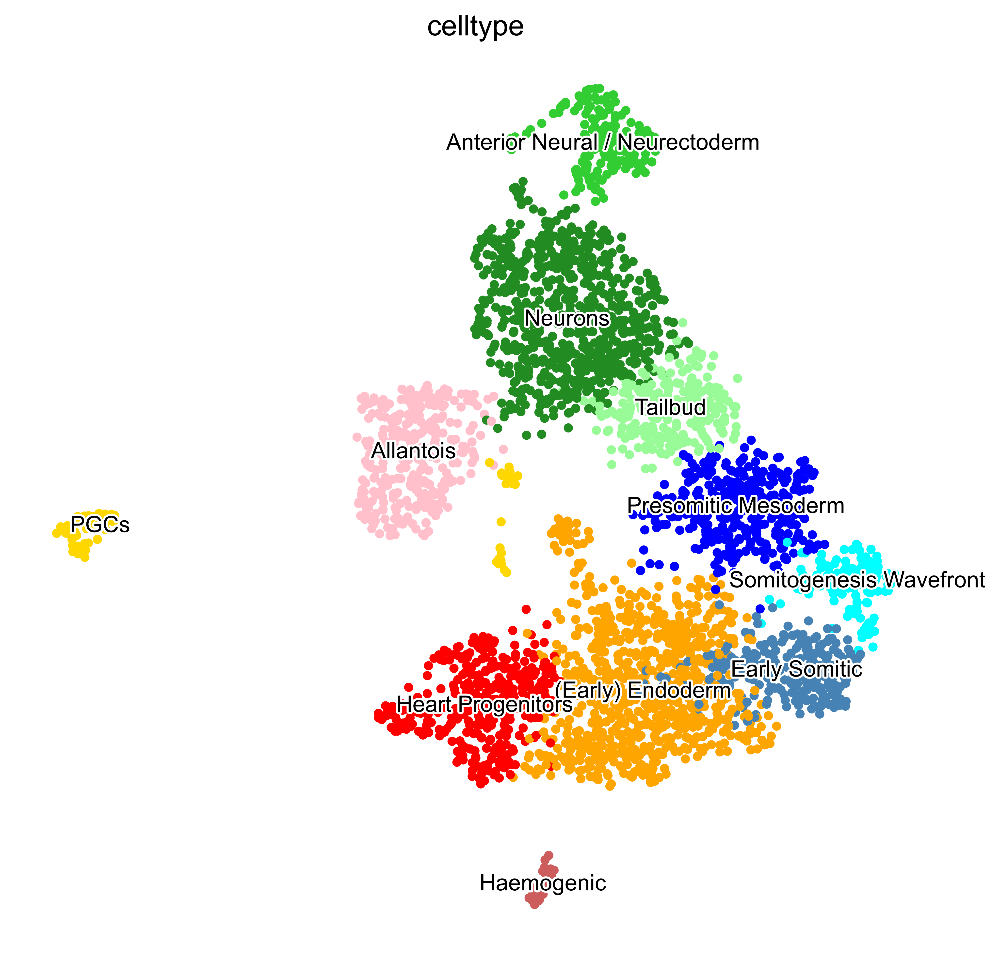

In [79]:
fig,ax = plt.subplots(figsize=(8,8))
ax = sc.pl.umap(adata, color = 'celltype', ax=ax, legend_fontweight='normal',legend_fontsize=11,
                palette = ['orange','pink','limegreen','steelblue','indianred','red','forestgreen',
                          'gold','blue','cyan','palegreen'],
                frameon=False,size = 80, legend_loc = 'on data', legend_fontoutline=2)


Now that we annotated the cell types, let us visualize the marker genes.

In [123]:
sc.set_figure_params(scanpy=True,dpi=500,frameon=False, fontsize = 14)


In [124]:
order = ['Anterior Neural / Neurectoderm', 'Neurons','Tailbud', 'Presomitic Mesoderm', 
         'Somitogenesis Wavefront','Early Somitic','(Early) Endoderm', 'Heart Progenitors', 
         'Haemogenic','Allantois', 'PGCs']


marker_genes = [ 
    
    'Ass1',#allantois
         'Crabp1',#anterior neural
'Sox1', 'Sox2','Nkx1-2',#neuron
    'Irx5','Irx1','Prdm1','Emb','Meis2',#early endoderm
    'Pax3', 'Meox1','Pax3',#early somitic
        'Kdr', 'Car2','Hand1', 'Hand2', 'Gata4', 'Gata6','Bmp4', #heart, haemogenic

    'Nanog','Epcam','Cdh1','Trh','Mt1','Ephx2',#PGC/node
    'Dll1','Tbx6',#presomitic
                'Notch1','Aldh1a2','Lfng',#somites
                'Hes7','T','Wnt3a','Cdx2','Fgf17','Fgf8' #Tailbud
            ]

marker_genes = [
    'Elavl3','Sox21','Foxg1', #neurecto/neural tube
    'Sox1','Sox2','Nkx1-2', #neural
    'T','Cdx2','Fgf8','Wnt3a', #tailbud
    'Dll1','Tbx6', #presomitic
    'Lfng','Notch1','Aldh1a2', #wavefront
    'Meox1','Pax3', #somitic
    'Prdm1','Irx1', #endo
    'Hand1','Hand2','Gata6', #heart
    'Kdr','Sox7', #haeomgenic
    'Tbx4','Stx3','Klf9', #allantois
    'Nanog','Esrrb'  #PGCs
]


ax = sc.pl.dotplot(adata, marker_genes, groupby='celltype', categories_order = order)#  ,save='dotplot_markergenes.png')

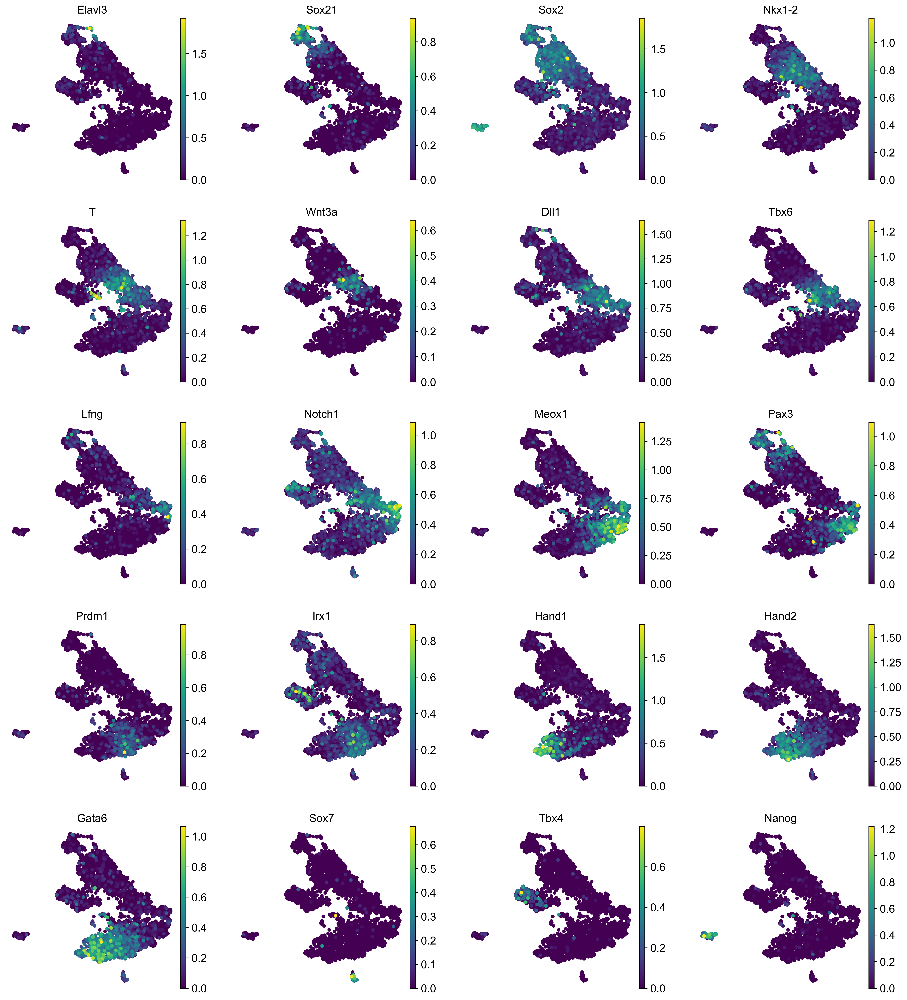

In [77]:
sc.set_figure_params(dpi=200, color_map = 'viridis')

genes = [
    'Elavl3','Sox21', #neurecto/neural tube
    'Sox2','Nkx1-2', #neural
    'T','Wnt3a', #tailbud
    'Dll1','Tbx6', #presomitic
    'Lfng','Notch1', #wavefront
    'Meox1','Pax3', #somitic
    'Prdm1','Irx1', #endo
    'Hand1','Hand2','Gata6', #heart
    'Sox7', #haeomgenic
    'Tbx4', #allantois
    'Nanog'  #PGCs
]

sc.pl.umap(adata, color=genes, use_raw = True, size = 80, frameon = False, ncols = 4)

In [126]:
import collections

In [127]:
counts = collections.defaultdict(dict)
for gastruloid in adata.obs['batch'].unique():
    counts[gastruloid]['total'] = adata.obs['batch'].str.count(gastruloid).sum()
    for celltype in adata.obs['celltype'].unique():
        counts[gastruloid][celltype] =  adata.obs[adata.obs['celltype'] == celltype]['batch'].str.count(gastruloid).sum()

In [128]:
counts2 = collections.defaultdict(dict)
for gastruloid in adata.obs['batch'].unique():
    counts2[gastruloid] = [('total', adata.obs['batch'].str.count(gastruloid).sum())]
    for celltype in adata.obs['celltype'].unique():
        counts2[gastruloid] =  [(celltype, adata.obs[adata.obs['celltype'] == celltype]['batch'].str.count(gastruloid).sum())]

In [129]:
pd.DataFrame(counts2)

,C5A4,C5C3,C5F2,C5B4,C5G5,C5H10,C9C10,C9E10,C9B8,C9D12,C5A9,C5B10,C5C6,C5H7,C5H9,C5H11,C5G7,C5F10
0,"(Early Somitic, 0)","(Early Somitic, 5)","(Early Somitic, 0)","(Early Somitic, 22)","(Early Somitic, 4)","(Early Somitic, 0)","(Early Somitic, 16)","(Early Somitic, 1)","(Early Somitic, 19)","(Early Somitic, 0)","(Early Somitic, 25)","(Early Somitic, 4)","(Early Somitic, 22)","(Early Somitic, 42)","(Early Somitic, 29)","(Early Somitic, 7)","(Early Somitic, 60)","(Early Somitic, 7)"


In [130]:
gastruloid_counts = pd.DataFrame(counts).T

In [131]:
def reformat(celltype):
    x = pd.DataFrame(gastruloid_counts[celltype]).reset_index()
    x['measurement'] = celltype
    x = x.rename(columns = {celltype:'counts'})
    return(x)


a = reformat('total')
b = reformat('(Early) Endoderm')
c = reformat('Neurons')
d = reformat('Presomitic Mesoderm')
e = reformat('Somitogenesis Wavefront')
f = reformat('Allantois')
g = reformat('Tailbud')
h = reformat('PGCs')
i = reformat('Haemogenic')
j = reformat('Anterior Neural / Neurectoderm')
k = reformat('Heart Progenitors')
l = reformat('Early Somitic')
z = pd.concat([b,c,d,e,f,g,h,i,j,k,l])


In [136]:
gastruloid_counts = gastruloid_counts.reset_index().rename(columns={'index':'gastruloid'})
gastruloid_counts

,gastruloid,total,(Early) Endoderm,Neurons,Presomitic Mesoderm,Somitogenesis Wavefront,Allantois,Tailbud,PGCs,Haemogenic,Anterior Neural / Neurectoderm,Heart Progenitors,Early Somitic
0,C5A4,4,1,0,0,0,0,0,3,0,0,0,0
1,C5C3,88,31,12,10,5,10,5,6,3,1,0,5
2,C5F2,220,113,21,42,3,13,13,5,1,3,6,0
3,C5B4,174,52,16,33,7,10,18,10,4,0,2,22
4,C5G5,134,28,6,22,6,5,5,5,1,0,52,4
5,C5H10,2,0,0,0,0,0,0,0,0,2,0,0
6,C9C10,211,97,5,17,11,25,17,8,5,10,0,16
7,C9E10,158,47,7,17,6,15,18,8,0,2,37,1
8,C9B8,128,10,59,10,6,11,13,0,0,0,0,19
9,C9D12,105,23,13,8,0,7,8,4,0,0,42,0


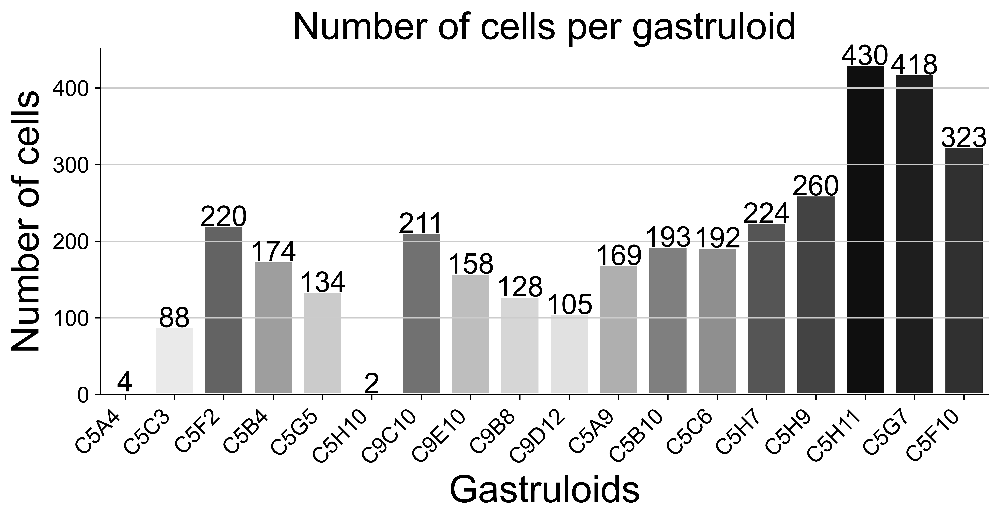

In [138]:
fig,ax = plt.subplots(figsize=(10,4))
fontsize = 24
sns.set_context("talk")
sns.set_style('ticks')

pal = sns.color_palette("Greys_r", len(gastruloid_counts))
rank = gastruloid_counts["total"].argsort().argsort() 

ax = sns.barplot(x='gastruloid',y='total',data=gastruloid_counts.reset_index()#, color='black')
                 ,palette=np.array(pal[::-1])[rank])



for index, row in gastruloid_counts.iterrows():
    ax.text(row.name, row.total, round(row.total,2), color='black', ha="center", va = 'baseline')

ax.tick_params(axis = 'x',rotation=45)
plt.setp(ax.xaxis.get_majorticklabels(), ha='right')
ax.set_xlabel("Gastruloids",fontsize=fontsize)
ax.set_title('Number of cells per gastruloid', fontsize=fontsize)
ax.set_ylabel("Number of cells",fontsize=fontsize)


sns.despine()

plt.show()




In [140]:
percentages = new.T[new.loc['total'] > 150].T

for gastruloid in percentages:
    percentages[gastruloid] = percentages[gastruloid]/percentages[gastruloid]['total']*100


In [141]:
cols= ['orange','forestgreen','blue','cyan','pink','palegreen','gold','indianred',
       'limegreen','red','steelblue']

fig,ax = plt.subplots(figsize=(12,6), dpi = 500)
#sns.set_context("talk")
sns.set_style('ticks')
#mpl.rcParams['pdf.fonttype'] = 42
#mpl.rcParams['ps.fonttype'] = 42
#mpl.rcParams['font.family'] = 'Arial'
fontsize = 24
ax = percentages.loc['(Early) Endoderm':].T.plot.bar(stacked=True,figsize=(15,5),fontsize = 20,width=0.90, 
                                                     color=cols, ax = ax)
ax.set_xlabel("Gastruloids",fontsize=fontsize)
ax.set_title('Distribution of cell types in individual gastruloids', fontsize=fontsize)
ax.set_ylabel("Percentage of cells",fontsize=fontsize)
ax.tick_params(axis='x', rotation=45)
plt.setp(ax.xaxis.get_majorticklabels(), ha='right')
#ax.set_xticklabels("")
sns.despine()
ax.legend(bbox_to_anchor=(0.9,-0.4))
#ax.legend([],frameon=False)

In [142]:
adata = sc.read(results_file)